In [38]:
#function to run bash commands cleanly
js <- function(shell_command){
    cat(system(shell_command, intern=TRUE), sep='\n')}

In [ ]:
FILTERS="-uniqueOnly 1 -remove_bads 1 -minMapQ 20 -minQ 25 \
-sb_pval 1e-5 -skipTriallelic 1 -minInd 80 -minIndDepth 3 -snp_pval 1e-3 -minMaf 0.01"
# output commands for most outputs
TODOvcf="-doMajorMinor 1 -doMaf 1 -doCounts 1 -doIBS 1 -doCov 1 -makeMatrix 1 -doGeno 9 \
-doPost 1 -doGlf 2 -dosnpstat 1"
# output commands for PCA friendly output
TODOpca="-doMajorMinor 1 -doMaf 1 -doCounts 1 -doGeno 32 -doPost 1 -dosnpstat 1"

TODOrelate="-doMajorMinor 1 -doMaf 1 -doCounts 1 -doPost 1 -doGlf 3 -dosnpstat 1"

angsd -b SSHCbams_filt_nreps -GL 1 $FILTERS $TODOvcf -P 1 -out ../ANGSD_run/HCSS_Afilt32m70_01

angsd -b SSHCbams_filt_nreps -GL 1 $FILTERS $TODOpca -P 1 -out ../ANGSD_run/HCSS_Afilt32m70_01pca 

angsd -b SSHCbams_filt_nreps -GL 1 $FILTERS $TODOrelate -P 1 -out ../ANGSD_run/HCSS_Afilt32m70_01relate


# Making VCF file for PCA and Bayescan

In [8]:
SUFFIX = '../analyses/2bRAD/Inputs/HCSS_Afilt32m70_01'
POP = '../analyses/2bRAD/PopGen/HCSS_Afilt32m70_01'
INPUT = '../analyses/2bRAD/Inputs/'

In [1]:
pwd

/scratch/t.cri.ksilliman/CommonG_cp2/2019_Mapping/paper-oly-mbdbs-gen/code


In [6]:
module load gcc/6.2.0
module load ngstools
module load vcftools/0.1.15
module load qctool/2.0
module load htslib/1.7.36
module load ngsadmix/32
module load fastme/2.1.5
NGSTOOLS="/apps/software/gcc-6.2.0/ngstools"

## Make population file

In [2]:
# make ind2pop file for Admixture, Bayescan conversion
infile = "../analyses/2bRAD/Inputs/SSHCbams_filt_nreps"
outfile = "../analyses/2bRAD/Inputs/SSHCfiltNreps.ind2pop"
IN= open(infile,"r")
OUT = open(outfile,"w")

for line in IN:
    stuff = line.split(".")
    name = stuff[0]
    pop = name[0:2]
    OUT.write(name+"\t"+pop+"\n")
IN.close()
OUT.close()

## Make VCF file

In [3]:
# make ind file for qctool
infile = "../analyses/2bRAD/Inputs/SSHCbams_filt_nreps"
outfile = "../analyses/2bRAD/Inputs/SSHCfiltNreps.ind"
IN= open(infile,"r")
OUT = open(outfile,"w")

OUT.write("ID\n0\n")
for line in IN:
    stuff = line.split(".")
    name = stuff[0]
    OUT.write(name+"\n")
IN.close()
OUT.close()

In [9]:
%expand

cp {SUFFIX}.geno.gz {SUFFIX}cp.geno.gz
gunzip {SUFFIX}cp.geno.gz
sed -i 's/\t/ /g' {SUFFIX}cp.geno
sed -i 's/.$//' {SUFFIX}cp.geno
sed -i 's/^/--- /' {SUFFIX}cp.geno
mv {SUFFIX}cp.geno {SUFFIX}.gen
qctool_v2.0-rc5 -g {SUFFIX}.gen -threshhold 0.9 -og {SUFFIX}_pp90.vcf -s ../analyses/2bRAD/Inputs/SSHCfiltNreps.ind
rm {SUFFIX}.gen


Welcome to qctool
(version: 2.0-rc5, revision )

(C) 2009-2017 University of Oxford

Opening genotype files                                      : [******************************] (1/1,0.0s,103.0/s)

Input SAMPLE file(s):           "../analyses/2bRAD/Inputs/SSHCfiltNreps.ind"
Output SAMPLE file:             "(n/a)".
Sample exclusion output file:   "(n/a)".

Input GEN file(s):
           ThreshholdingSNPDataSource(chain:../analyses/2bRAD/Inputs/HCSS_Afilt32m70_01.gen)Output GEN file(s):             "../analyses/2bRAD/Inputs/HCSS_Afilt32m70_01_pp90.vcf"
Output SNP position file(s):    (n/a)
Sample filter:                  .
# of samples in input files:    114.
# of samples after filtering:   114 (0 filtered out).


VCFFormatSNPDataSink::write_header(): FORMAT entries are:
##FORMAT=<ID=GP,Type=Float,Number=G,Description="Genotype call probabilities">
##FORMAT=<ID=GT,Type=String,Number=1,Description="Genotype call probabilities, threshholded at 0.90">

Processing SNPs                     

In [10]:
%expand
# fix contig naming in vcf
IN = open("{SUFFIX}_pp90.vcf","r")
OUT = open("{SUFFIX}_pp90_con.vcf","w")

for line in IN:
    if "#" not in line:
        stuff = line.split()
        contig = stuff[2].split(",")[0]
        ID = contig+":"+stuff[1]
        stuff[0] = contig
        stuff[2] = ID
        OUT.write('\t'.join(stuff)+"\n")
    else:
        OUT.write(line)

IN.close()
OUT.close()

In [11]:
%expand
rm {SUFFIX}_pp90.vcf
mv {SUFFIX}_pp90_con.vcf {SUFFIX}_pp90.vcf

# Outlier analysis with Bayescan  
Convert VCF to bayescan format with PGDspider

### Run Bayescan on cluster

In [34]:
cat BS10.sh

#PBS -N HCSS_BS10
#PBS -S /bin/bash
#PBS -l nodes=1:ppn=16
#PBS -l walltime=100:00:00
#PBS -l mem=20GB
#PBS -o HCSS_BS10.stout
#PBS -e HCSS_BS10.err

cd /scratch/t.cri.ksilliman/CommonG_cp2/2019_Mapping/ANGSD_run/HCSS/Outlier

~/Downloads/BayeScan2.1/binaries/BayeScan2.1_linux64bits HCSS_Afilt32m70_01_pp90.bayescan \
-snp -threads 16 -n 100000 -pr_odds 10 -o HCSS_Afilt32m70_01_pp90-BS-po10



### Analyze Bayescan results

In [35]:
source("~/Downloads/BayeScan2.1/R functions/plot_R.r")

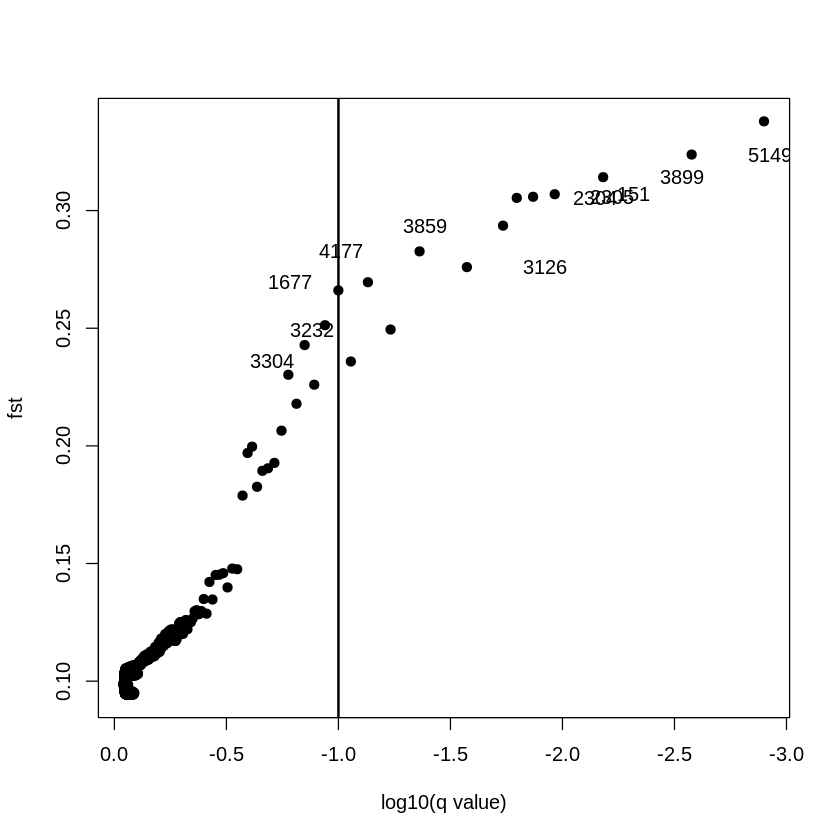

In [37]:

BS<- plot_bayescan("{POP}_pp90-BS-po10_fst.txt",FDR=0.1)

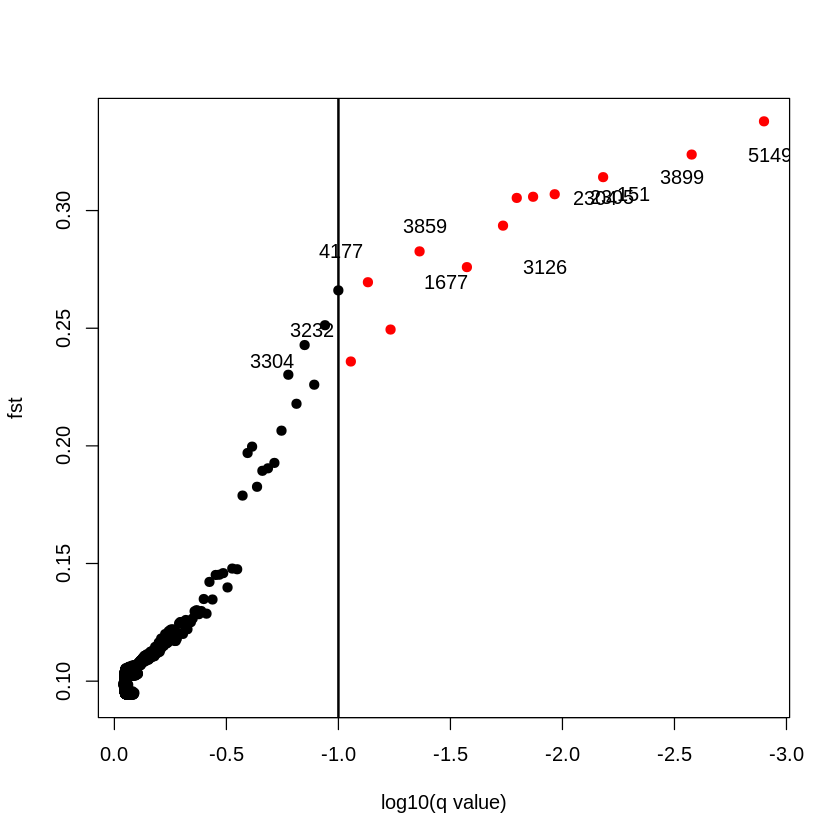

In [38]:
%expand
BS<- plot_bayescan("{POP}_pp90-BS-po10_fst.txt",FDR=0.1, highlight = BS$outliers)

In [39]:
BS$nb_outliers

[1] 12

Select out outlier's from VCF

In [40]:
%expand
../../../2bRAD_denovo/removeBayescanOutliers.pl bayescan={POP}_pp90-BS-po10_fst.txt vcf={SUFFIX}_pp90.vcf FDR=0.1 mode=extract > {POP}_pp90_BSouts.vcf

In [41]:
%expand
cat {POP}_pp90_BSouts.vcf

##fileformat=VCFv4.2
##FORMAT=<ID=GP,Type=Float,Number=G,Description="Genotype call probabilities">
##FORMAT=<ID=GT,Type=String,Number=1,Description="Genotype call probabilities, threshholded at 0.90">
#CHROM	POS	ID	REF	ALT	QUAL	FILTER	INFO	FORMAT	HC1-11	HC1-12	HC1-13	HC1-14-L5	HC1-15	HC1-18	HC1-19	HC1-2B-L5	HC1-3	HC1-4	HC1-9	HC2-1	HC2-10	HC2-11-L5	HC2-12	HC2-13	HC2-14	HC2-15A-L5	HC2-16	HC2-17B	HC2-18	HC2-19	HC2-2	HC2-20	HC2-3	HC2-4	HC2-5-L5	HC2-7	HC2-9	HC3-1	HC3-10	HC3-11	HC3-12	HC3-13	HC3-14-L5	HC3-16	HC3-18	HC3-2	HC3-3	HC3-4	HC3-5-L5B	HC3-6	HC3-7	HC3-8	HC3-9	HC4-17-L5	HC4-1A	HC4-2	HC4-4B	HC4-5	HC4-6	HC5-10	HC5-11	HC5-14	HC5-15	HC5-16	HC5-3-L5	SS1-1	SS1-10-L5	SS1-12	SS1-14	SS1-17-L5	SS1-19	SS1-2	SS1-20-L5	SS1-5	SS1-6-L5	SS1-7-L5	SS1-8	SS2-10-L5	SS2-12A	SS2-13-L5	SS2-14-L5	SS2-15	SS2-16	SS2-17	SS2-18-L5	SS2-19	SS2-4B	SS2-5B-L5	SS2-9-L5	SS3-1	SS3-11	SS3-13	SS3-14	SS3-15	SS3-16	SS3-17	SS3-19	SS3-2	SS3-20	SS3-3	SS3-4-L5	SS3-5D	SS3-6	SS3-7	SS3-8	SS3-9	SS4-1	SS4-4	SS5-10-L5	SS5-11	SS5-12	S

In [42]:
%expand
f = open("{POP}_pp90_BSouts.vcf","r")
out = open("{POP}_pp90_BSouts.BED","w")

for line in f:
    if "#" not in line:
        chrom = line.split()[0]
        start = line.split()[1]
        out.write(chrom+"\t"+start+"\t"+start+"\n")
f.close()
out.close()

In [45]:
gf="../genome-features"

In [46]:
module load gcc/6.2.0
module load bedtools/2.29.0

In [47]:
%expand
bedtools intersect -wb -a "{POP}_pp90_BSouts.BED" -b "{gf}/Olurida_v081-20190709.gene.gff" >  {POP}_BS-gene.bed
bedtools intersect -wb -a "{POP}_pp90_BSouts.BED" -b "{gf}/Olurida_v081-20190709.gene.2kbslop.gff" >  {POP}_BS-gene2kb.bed
bedtools intersect -wb -a "{POP}_pp90_BSouts.BED" -b "{gf}/Olurida_v081-20190709.2kbflank-up.gff" >  {POP}_BS-2kbflank-up.bed
bedtools intersect -wb -a "{POP}_pp90_BSouts.BED" -b "{gf}/Olurida_v081-20190709.2kbflank-down.gff" >  {POP}_BS-2kbflank-down.bed
bedtools intersect -wb -a "{POP}_pp90_BSouts.BED" -b "{gf}/Olurida_v081-20190709.exon.gff" >  {POP}_BS-exon.bed
bedtools intersect -wb -a "{POP}_pp90_BSouts.BED" -b "{gf}/Olurida_v081-20190709.CDS.gff" >  {POP}_BS-CDS.bed
bedtools intersect -wb -a "{POP}_pp90_BSouts.BED" -b "{gf}/Olurida_v081-20190709.mRNA.gff" >  {POP}_BS-mRNA.bed
bedtools intersect -wb -a "{POP}_pp90_BSouts.BED" -b "{gf}/Olurida_v081_TE-Cg.gff" >  {POP}_BS-TE.bed
bedtools intersect -v -a "{POP}_pp90_BSouts.BED" -b "{gf}/Olurida_v081-20190709.gene.2kbslop.gff" "{gf}/Olurida_v081-20190709.exon.gff" "{gf}/Olurida_v081-20190709.CDS.gff" "{gf}/Olurida_v081-20190709.mRNA.gff" "{gf}/Olurida_v081_TE-Cg.gff" >  {POP}_BS-unknown.bed

In [48]:
%expand
for i in {POP}_BS*.bed
do
    echo $i
    cat $i
done

../analyses/2bRAD/PopGen/HCSS_Afilt32m70_01_BS-2kbflank-down.bed
Contig77382	11621	11621	Contig77382	maker	gene	10919	12918	.	+	.	ID=OLUR_00016056;Name=OLUR_00016056;Alias=snap_masked-Contig77382-processed-gene-0.0;Note=Similar to Socs5: Suppressor of cytokine signaling 5 (Mus musculus OX%3D10090);Dbxref=Gene3D:G3DSA:3.30.505.10,InterPro:IPR000980,InterPro:IPR036860,MobiDBLite:mobidb-lite,Pfam:PF00017,SUPERFAMILY:SSF55550;
../analyses/2bRAD/PopGen/HCSS_Afilt32m70_01_BS-2kbflank-up.bed
../analyses/2bRAD/PopGen/HCSS_Afilt32m70_01_BS-CDS.bed
../analyses/2bRAD/PopGen/HCSS_Afilt32m70_01_BS-exon.bed
../analyses/2bRAD/PopGen/HCSS_Afilt32m70_01_BS-gene2kb.bed
Contig29033	27589	27589	Contig29033	maker	gene	11407	32648	.	-	.	ID=OLUR_00003721;Name=OLUR_00003721;Alias=maker-Contig29033-snap-gene-0.4;Note=Similar to G2/mitotic-specific cyclin-B (Hydra viridissima OX%3D6082);Dbxref=CDD:cd00043,Gene3D:G3DSA:1.10.472.10,InterPro:IPR004367,InterPro:IPR006671,InterPro:IPR013763,InterPro:IPR036915,InterP

# Relatedness

In [30]:
%expand

# relatedness (must run ANGSD with option '-doGlf 3' to make this work)
# (column "rab" in the result is relatedness coefficient, Fa and Fb are individual inbreeding coefficients):
zcat {SUFFIX}relate.mafs.gz | cut -f5 |sed 1d >freq
NIND=`cat SSHCbams_filt_nreps | wc -l`
ngsRelate -f freq -g {SUFFIX}relate.glf.gz -n $NIND -z ../analyses/2bRAD/Inputs/SSHCbams_filt_nreps -O {POP}.relatedness


	-> Number of file names read:114
	-> Seed is: 1220579229
	-> Frequency file: 'freq' contain 5269 number of sites
	-> nind:114 overall_number_of_sites:5269
	-> Done reading data from file: 0.12 0.00
	-> Starting analysis now
	-> length of joblist:6441
	[ALL done] cpu-time used =  156.24 sec (filereading took: 0.12 sec)
	[ALL done] walltime used =  39.00 sec (filereading took: 0.00 sec)


### Relatedness for MACAU

In [13]:
%expand
mbd = ["HC1-2B-L5","HC1-4","HC2-15A-L5","HC2-17B","HC3-1","HC3-5-L5B","HC3-7","HC3-10","HC3-11",
        "SS2-9-L5","SS2-14-L5","SS2-18-L5","SS3-3","SS3-14","SS3-15","SS3-16","SS3-20","SS5-18"]

IN = open("{POP}.relatedness","r")
OUT = open("{POP}_mbd.relatedness","w")

OUT.write(next(IN))
for line in IN:
    stuff = line.split()
    id1 = stuff[2].split(".")[0]
    id2 = stuff[3].split(".")[0]
    if id1 in mbd and id2 in mbd:
        OUT.write(line)

IN.close()
OUT.close()

In [14]:
%expand
# new name for HCSSmbdsamples_rab.txt
library(spaa)
df = read.table("{POP}_mbd.relatedness",header = T)
dfrab <- df[,c("ida","idb","rab")]
distrab <- as.matrix(list2dist(dfrab))

mbdnames = c("hc1_2","hc1_4","hc2_15","hc2_17","hc3_1","hc3_10","hc3_11","hc3_5","hc3_7",
        "ss2_14","ss2_18","ss2_9","ss3_14","ss3_15","ss3_16","ss3_20","ss3_3","ss5_18")

mbdorder = c("hc1_2","hc1_4","hc2_15","hc2_17","hc3_1","hc3_5","hc3_7","hc3_10","hc3_11",
        "ss2_9","ss2_14","ss2_18","ss3_3","ss3_14","ss3_15","ss3_16","ss3_20","ss5_18")

colnames(distrab) <- mbdnames
rownames(distrab) <- mbdnames
distrab <- distrab[mbdorder,mbdorder]
distrab
write.table(distrab,file="{POP}_mbd_rab.txt", col.names = F, row.names = F, sep = "\t")

,hc1_2,hc1_4,hc2_15,hc2_17,hc3_1,hc3_5,hc3_7,hc3_10,hc3_11,ss2_9,ss2_14,ss2_18,ss3_3,ss3_14,ss3_15,ss3_16,ss3_20,ss5_18
hc1_2,0.000000,0.001012,0.024934,0.010583,0.005485,0.469927,0.000008,0.096849,0.018067,0.000000,0.000000,0.000004,0.000000,0.000000,0.000000,0.000000,0.000001,0.000000
hc1_4,0.001012,0.000000,0.132775,0.281727,0.178630,0.023207,0.303820,0.000022,0.045449,0.000005,0.000001,0.000003,0.000001,0.000000,0.000000,0.000000,0.004360,0.000002
hc2_15,0.024934,0.132775,0.000000,0.091522,0.105287,0.010846,0.202777,0.215808,0.000063,0.000043,0.000001,0.019309,0.000019,0.000011,0.000001,0.000050,0.032588,0.000001
hc2_17,0.010583,0.281727,0.091522,0.000000,0.178815,0.028365,0.269209,0.002958,0.014182,0.000000,0.000001,0.000007,0.000000,0.000002,0.000000,0.000001,0.000000,0.000000
hc3_1,0.005485,0.178630,0.105287,0.178815,0.000000,0.000013,0.505421,0.000000,0.052670,0.000008,0.000000,0.000002,0.000000,0.000001,0.000000,0.000001,0.000001,0.000000
hc3_5,0.469927,0.023207,0.010846,0.028365,0.000013,0.000000,0.000008,0.098506,0.017887,0.000000,0.000000,0.000001,0.000000,0.000001,0.000001,0.000001,0.000000,0.000000
hc3_7,0.000008,0.303820,0.202777,0.269209,0.505421,0.000008,0.000000,0.000003,0.019617,0.000004,0.000000,0.000001,0.000001,0.000002,0.000000,0.000000,0.000000,0.000000
hc3_10,0.096849,0.000022,0.215808,0.002958,0.000000,0.098506,0.000003,0.000000,0.001493,0.000000,0.000001,0.000017,0.001741,0.000000,0.059200,0.000003,0.000185,0.000014
hc3_11,0.018067,0.045449,0.000063,0.014182,0.052670,0.017887,0.019617,0.001493,0.000000,0.000000,0.000000,0.000028,0.000001,0.000003,0.000000,0.000001,0.000000,0.000000
ss2_9,0.000000,0.000005,0.000043,0.000000,0.000008,0.000000,0.000004,0.000000,0.000000,0.000000,0.342654,0.251279,0.286739,0.231220,0.000001,0.235655,0.012028,0.188717


## NgsAdmix 

In [26]:
%expand [ ]

for J in `seq 1 10` ;
do 
    for K in `seq 1 5` ; 
    do 
        NGSadmix -likes [SUFFIX].beagle.gz -K $K -P 8 -o [POP]_K${K}_run${J};
    done
done

	-> Dumping file: ../analyses/2bRAD/PopGen/HCSS_Afilt32m70_01_K1_run1.log
	-> Dumping file: ../analyses/2bRAD/PopGen/HCSS_Afilt32m70_01_K1_run1.filter
Input: lname=../analyses/2bRAD/Inputs/HCSS_Afilt32m70_01.beagle.gz nPop=1, fname=(null) qname=(null) outfiles=../analyses/2bRAD/PopGen/HCSS_Afilt32m70_01_K1_run1
Setup: seed=1602444237 nThreads=8 method=1
Convergence: maxIter=2000 tol=0.000010 tolLike50=0.100000 dymBound=0
Filters: misTol=0.050000 minMaf=0.050000 minLrt=0.000000 minInd=0
Input file has dim: nsites=5269 nind=114
Input file has dim (AFTER filtering): nsites=3724 nind=114
iter[start] like is=733274.256021
EM accelerated Thread has reached convergence with tol 0.000010
best like=-325600.118105 after 4 iterations
	-> Dumping file: ../analyses/2bRAD/PopGen/HCSS_Afilt32m70_01_K1_run1.qopt
	-> Dumping file: ../analyses/2bRAD/PopGen/HCSS_Afilt32m70_01_K1_run1.fopt.gz
	[ALL done] cpu-time used =  0.49 sec
	[ALL done] walltime used =  1.00 sec
	-> Dumping file: ../analyses/2bRAD/Po

In [29]:
%expand 
(for log in `ls {POP}*K*.log`; do grep -Po 'like=\K[^ ]+' $log; done) > {POP}_admix.logfile

In [30]:
%expand
logs <- as.data.frame(read.table("{POP}_admix.logfile"))
logs$K <- c(rep("1", 10), rep("2", 10), rep("3", 10), rep("4", 
    10), rep("5", 10))
write.table(logs[, c(2, 1)], "{POP}_admix.logfile_formatted", row.names = F, 
    col.names = F, quote = F)

Upload formatted logfile to CLUMPAK to get best K.

In [15]:
%expand
admix <- t(as.matrix(read.table("{POP}_K2_run1.qopt")))
head(admix[, 1:10])

V1,0.8294763,1e+00,1e+00,0.92016105,0.8500837,0.880079,0.493016,1e+00,9.999196e-01,0.8551021
V2,0.1705237,1e-09,1e-09,0.07983895,0.1499163,0.119921,0.506984,1e-09,8.044331e-05,0.1448979


,V1,V2,ind,pop
HC1-11,0.8294763,0.170523674,HC1-11,HC
HC1-12,1.0000000,0.000000001,HC1-12,HC
HC1-13,1.0000000,0.000000001,HC1-13,HC
HC1-14-L5,0.9201610,0.079838950,HC1-14-L5,HC
HC1-15,0.8500837,0.149916285,HC1-15,HC


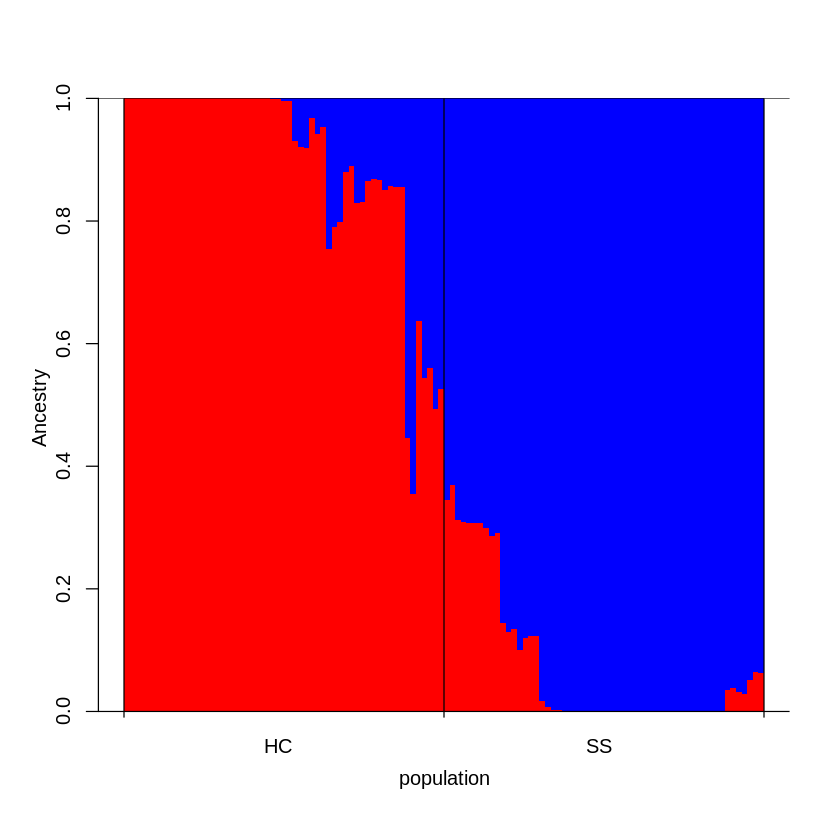

In [25]:
%expand
# primitive look at admixture data:
# tbl=read.table("rads.2.Q")
# barplot(t(as.matrix(tbl)), col=rainbow(5),xlab="Individual #", ylab="Ancestry", border=NA)

#-----------------
# prettier:

# assembling the input table
inName="{POP}_K2_run1.qopt" # name of the input file to plot, output of ngsAdmix or ADMIXTURE run
npops=2
pops="../analyses/2bRAD/Inputs/SSHCfiltNreps.ind2pop" # 2-column tab-delimited table of individual assignments to populations; must be in the same order as samples in the bam list or vcf file.
tbl=read.table(inName,header=F)
i2p=read.table(pops,header=F)
names(i2p)=c("ind","pop")
tbl=cbind(tbl,i2p)
row.names(tbl)=tbl$ind

head(tbl,5) # this is how the resulting dataset must look

source("../../../2bRAD_denovo/plot_admixture_v5_function.R") # file from z0on github

# putting populaitons in desired order (edit pop names as needed or skip to plot them alphabetically)
tbl$pop=factor(tbl$pop,levels=c("HC","SS"))

ords=plotAdmixture(data=tbl,npops=npops,angle=0,vshift=0.05,hshift=0,colors = c("red","blue"))


## Genetic Distances

In [33]:
%expand

mkdir Results
NIND=`cat ../analyses/2bRAD/Inputs/SSHCbams_filt_nreps | wc -l`
NSITES=`zcat {SUFFIX}relate.mafs.gz | tail -n+2 | wc -l`
ngsDist -verbose 1 -geno {SUFFIX}relate.geno.gz -probs -n_ind $NIND -n_sites $NSITES -labels ../analyses/2bRAD/Inputs/SSHCfiltNreps.ind2pop -o {POP}.dist -n_threads 8 
head {POP}.dist

mkdir: cannot create directory `Results': File exists
==> Input Arguments:
	geno: HCSS_Afilt32m70_01relate.geno.gz
	probs: true
	log_scale: false
	n_ind: 114
	n_sites: 5269
	tot_sites: 0
	labels: SSHCfiltNreps.ind2pop (WITHOUT header)
	call_geno: false
	N_thresh: 0.000000
	call_thresh: 0.000000
	pairwise_del: false
	avg_nuc_dist: false
	geno_indep: false
	n_boot_rep: 0
	boot_block_size: 1
	out: Results/HCSS_Afilt32m70_01.dist
	n_threads: 8
	version: false
	verbose: 1
	seed: 1564768358

==> Analysis will be run in 6441 combinations
==> GZIP input file (never BINARY)
==> Reading labels
==> Reading genotype data
==> Analyzing full dataset...
==> Freeing memory...
Done!

114
HC1-11	0.0000000000	0.2202145291	0.2085823468	0.2190188544	0.1089129551	0.1304326489	0.2257901914	0.2170406541	0.2172036299	0.2213345655	0.2109273935	0.2161100046	0.2193427776	0.2246773265	0.2128498063	0.2202992339	0.2186809182	0.2133651894	0.2247884782	0.2258824167	0.2207885918	0.2169592685	0.2258850624	0.2189896903	0

In [27]:
%expand

fastme -D 1 -i {POP}.dist -o {POP}dist.tree -m b -n b


 . This analysis will run on 8 threads.

#  Analysing dataset 1

 . Warning: Triangular inequality violation.

 . You may ask for triangular inequality correction using the '-q' option.

 . Computing tree...

 . Performing NNI...

 . Warning: 
	Explained variance = 0.889 (<0.90).
	Check your input data.

 . Time used 0h00m00s


In [ ]:
%expand 
library(ape)
library(phangorn)

#pdf(file=fout)

plot(read.tree("{POP}dist.tree"), cex=0.5)

### Just mbd samples

In [32]:
%expand
dist.mat <- read.table("{POP}.dist", header= F, row.names = 1, skip = 2)
colnames(dist.mat) <- rownames(dist.mat)
mbdnames = c("HC1-2B-L5","HC1-4","HC2-15A-L5","HC2-17B","HC3-1","HC3-5-L5B","HC3-7","HC3-10","HC3-11",
        "SS2-9-L5","SS2-14-L5","SS2-18-L5","SS3-3","SS3-14","SS3-15","SS3-16","SS3-20","SS5-18")
mbd <- dist.mat[mbdnames,mbdnames]

mbdorder = c("hc1_2","hc1_4","hc2_15","hc2_17","hc3_1","hc3_5","hc3_7","hc3_10","hc3_11",
        "ss2_9","ss2_14","ss2_18","ss3_3","ss3_14","ss3_15","ss3_16","ss3_20","ss5_18")
colnames(mbd) <- mbdorder
rownames(mbd) <- mbdorder
mbd
write.table(mbd, file = "{POP}_mbd.dist", row.names = T, col.names = T, quote = F, sep="\t")
line="18"
tmp <- "{POP}_mbdinput.dist"
cat(line, "\n", file = tmp) 
write.table(mbd, file = tmp, append = TRUE, row.names = T, col.names=F,quote = F, sep = "\t")

,hc1_2,hc1_4,hc2_15,hc2_17,hc3_1,hc3_5,hc3_7,hc3_10,hc3_11,ss2_9,ss2_14,ss2_18,ss3_3,ss3_14,ss3_15,ss3_16,ss3_20,ss5_18
hc1_2,0.0000000,0.2155436,0.2054988,0.2245761,0.2140475,0.1251035,0.2137833,0.1941731,0.2196581,0.2191748,0.2201363,0.2251679,0.2293540,0.2303018,0.2273960,0.2267536,0.2241723,0.2393679
hc1_4,0.2155436,0.0000000,0.1844240,0.1693271,0.1811331,0.2071129,0.1608409,0.2090009,0.2157563,0.2186305,0.2188330,0.2146309,0.2291905,0.2247412,0.2257357,0.2190871,0.2157204,0.2274161
hc2_15,0.2054988,0.1844240,0.0000000,0.2041950,0.1854690,0.2021604,0.1823913,0.1592689,0.2168135,0.2041132,0.2085476,0.1910094,0.2042863,0.2045106,0.2061360,0.2040459,0.2013346,0.2098602
hc2_17,0.2245761,0.1693271,0.2041950,0.0000000,0.1884048,0.2163634,0.1724402,0.2179260,0.2265039,0.2268210,0.2268209,0.2283067,0.2379735,0.2322090,0.2385235,0.2269364,0.2294361,0.2372695
hc3_1,0.2140475,0.1811331,0.1854690,0.1884048,0.0000000,0.2084380,0.1141350,0.2070880,0.2092909,0.2195993,0.2160866,0.2155464,0.2254828,0.2196778,0.2258590,0.2205749,0.2200920,0.2156870
hc3_5,0.1251035,0.2071129,0.2021604,0.2163634,0.2084380,0.0000000,0.2104185,0.1869989,0.2143060,0.2202222,0.2148287,0.2214425,0.2216537,0.2194587,0.2223524,0.2192765,0.2221298,0.2263948
hc3_7,0.2137833,0.1608409,0.1823913,0.1724402,0.1141350,0.2104185,0.0000000,0.2098760,0.2154145,0.2211945,0.2233552,0.2236631,0.2265407,0.2248371,0.2269251,0.2224353,0.2260581,0.2286600
hc3_10,0.1941731,0.2090009,0.1592689,0.2179260,0.2070880,0.1869989,0.2098760,0.0000000,0.2158190,0.2072541,0.2123815,0.2048036,0.2057382,0.2078799,0.1916720,0.2139469,0.2081097,0.2118349
hc3_11,0.2196581,0.2157563,0.2168135,0.2265039,0.2092909,0.2143060,0.2154145,0.2158190,0.0000000,0.2204729,0.2206785,0.2201360,0.2362094,0.2252514,0.2307265,0.2282604,0.2200907,0.2270442
ss2_9,0.2191748,0.2186305,0.2041132,0.2268210,0.2195993,0.2202222,0.2211945,0.2072541,0.2204729,0.0000000,0.1482022,0.1643140,0.1565610,0.1642693,0.2091080,0.1664055,0.2066793,0.1738464


In [57]:
%expand
module load gcc/6.2.0
module load fastme/2.1.5

fastme -D 1 -i {POP}_mbdinput.dist -o {POP}dist_mbd.tree -m b -n b


 . This analysis will run on 10 threads.

#  Analysing dataset 1

 . Warning: Triangular inequality violation.

 . You may ask for triangular inequality correction using the '-q' option.

 . Computing tree...

 . Performing NNI...

 . Time used 0h00m00s


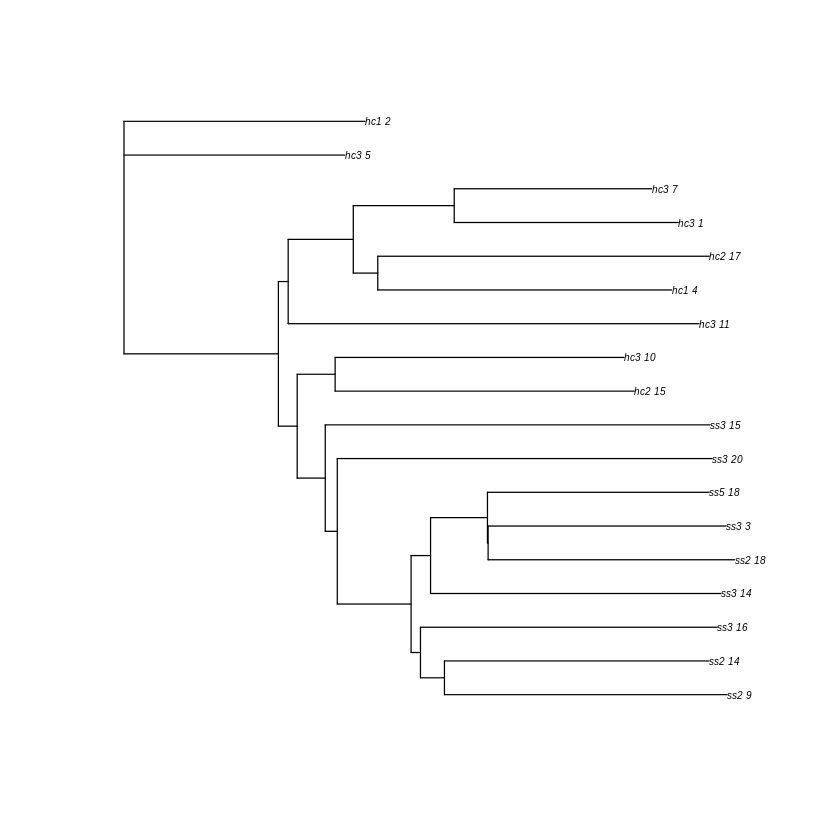

In [58]:
%expand 
library(ape)
library(phangorn)

#pdf(file=fout)

plot(read.tree("{POP}dist_mbd.tree"), cex=0.5)

### Dist: NonCpG-SNPs only

In [40]:
js("head ../analyses/2bRAD/Inputs/non-cpgsnps.bed")

Contig0	109120	109120
Contig0	109123	109123
Contig1	42880	42880
Contig3	14914	14914
Contig4	51093	51093
Contig5	121384	121384
Contig9	17749	17749
Contig17	36347	36347
Contig18	68219	68219
Contig18	68228	68228


In [44]:
x <- read.table("../analyses/2bRAD/Inputs/non-cpgsnps.bed")
write.table(x[,1:2],file="../analyses/2bRAD/Inputs/non-cpgsnps.sites",col.names = F,row.names = F,quote = F)

In [1]:
%%bash
#switch kernel
module load angsd/0.929
angsd sites index ../analyses/2bRAD/Inputs/non-cpgsnps.sites

	-> angsd version: 0.929-21-g4c6d001 (htslib: 1.5-20-ga159aa4) build(Jun  3 2019 09:05:25)
	-> Indexing ../analyses/2bRAD/Inputs/non-cpgsnps.sites and will add '0' to pos column
	-> Filterfile: ../analyses/2bRAD/Inputs/non-cpgsnps.sites supplied will generate binary representations... 
	-> Input file has 2 columns, chr pos
	-> Writing chr:'Contig0' 
	-> Writing chr:'Contig1' 
	-> Writing chr:'Contig3' 
	-> Writing chr:'Contig4' 
	-> Writing chr:'Contig5' 
	-> Writing chr:'Contig9' 
	-> Writing chr:'Contig17' 
	-> Writing chr:'Contig18' 
	-> Writing chr:'Contig24' 
	-> Writing chr:'Contig25' 
	-> Writing chr:'Contig32' 
	-> Writing chr:'Contig33' 
	-> Writing chr:'Contig38' 
	-> Writing chr:'Contig46' 
	-> Writing chr:'Contig55' 
	-> Writing chr:'Contig56' 
	-> Writing chr:'Contig65' 
	-> Writing chr:'Contig75' 
	-> Writing chr:'Contig83' 
	-> Writing chr:'Contig92' 
	-> Writing chr:'Contig95' 
	-> Writing chr:'Contig98' 
	-> Writing chr:'Contig120' 
	-> Writing chr:'Contig129' 
	-> Wri

In [33]:
%%bash

NIND=`cat ../analyses/2bRAD/Inputs/SSHCbams_filt_nreps | wc -l`
NSITES=`zcat {SUFFIX}relate.mafs.gz | tail -n+2 | wc -l`
ngsDist -verbose 1 -geno {SUFFIX}relate.geno.gz -probs -n_ind $NIND -n_sites $NSITES -labels ../analyses/2bRAD/Inputs/SSHCfiltNreps.ind2pop -o {POP}.dist -n_threads 8 
head {POP}.dist

mkdir: cannot create directory `Results': File exists
==> Input Arguments:
	geno: HCSS_Afilt32m70_01relate.geno.gz
	probs: true
	log_scale: false
	n_ind: 114
	n_sites: 5269
	tot_sites: 0
	labels: SSHCfiltNreps.ind2pop (WITHOUT header)
	call_geno: false
	N_thresh: 0.000000
	call_thresh: 0.000000
	pairwise_del: false
	avg_nuc_dist: false
	geno_indep: false
	n_boot_rep: 0
	boot_block_size: 1
	out: Results/HCSS_Afilt32m70_01.dist
	n_threads: 8
	version: false
	verbose: 1
	seed: 1564768358

==> Analysis will be run in 6441 combinations
==> GZIP input file (never BINARY)
==> Reading labels
==> Reading genotype data
==> Analyzing full dataset...
==> Freeing memory...
Done!

114
HC1-11	0.0000000000	0.2202145291	0.2085823468	0.2190188544	0.1089129551	0.1304326489	0.2257901914	0.2170406541	0.2172036299	0.2213345655	0.2109273935	0.2161100046	0.2193427776	0.2246773265	0.2128498063	0.2202992339	0.2186809182	0.2133651894	0.2247884782	0.2258824167	0.2207885918	0.2169592685	0.2258850624	0.2189896903	0

In [27]:
%expand

fastme -D 1 -i {POP}.dist -o {POP}dist.tree -m b -n b


 . This analysis will run on 8 threads.

#  Analysing dataset 1

 . Warning: Triangular inequality violation.

 . You may ask for triangular inequality correction using the '-q' option.

 . Computing tree...

 . Performing NNI...

 . Warning: 
	Explained variance = 0.889 (<0.90).
	Check your input data.

 . Time used 0h00m00s


In [ ]:
%expand 
library(ape)
library(phangorn)

#pdf(file=fout)

plot(read.tree("{POP}dist.tree"), cex=0.5)

### Just mbd samples

In [32]:
%expand
dist.mat <- read.table("{POP}.dist", header= F, row.names = 1, skip = 2)
colnames(dist.mat) <- rownames(dist.mat)
mbdnames = c("HC1-2B-L5","HC1-4","HC2-15A-L5","HC2-17B","HC3-1","HC3-5-L5B","HC3-7","HC3-10","HC3-11",
        "SS2-9-L5","SS2-14-L5","SS2-18-L5","SS3-3","SS3-14","SS3-15","SS3-16","SS3-20","SS5-18")
mbd <- dist.mat[mbdnames,mbdnames]

mbdorder = c("hc1_2","hc1_4","hc2_15","hc2_17","hc3_1","hc3_5","hc3_7","hc3_10","hc3_11",
        "ss2_9","ss2_14","ss2_18","ss3_3","ss3_14","ss3_15","ss3_16","ss3_20","ss5_18")
colnames(mbd) <- mbdorder
rownames(mbd) <- mbdorder
mbd
write.table(mbd, file = "{POP}_mbd.dist", row.names = T, col.names = T, quote = F, sep="\t")
line="18"
tmp <- "{POP}_mbdinput.dist"
cat(line, "\n", file = tmp) 
write.table(mbd, file = tmp, append = TRUE, row.names = T, col.names=F,quote = F, sep = "\t")

,hc1_2,hc1_4,hc2_15,hc2_17,hc3_1,hc3_5,hc3_7,hc3_10,hc3_11,ss2_9,ss2_14,ss2_18,ss3_3,ss3_14,ss3_15,ss3_16,ss3_20,ss5_18
hc1_2,0.0000000,0.2155436,0.2054988,0.2245761,0.2140475,0.1251035,0.2137833,0.1941731,0.2196581,0.2191748,0.2201363,0.2251679,0.2293540,0.2303018,0.2273960,0.2267536,0.2241723,0.2393679
hc1_4,0.2155436,0.0000000,0.1844240,0.1693271,0.1811331,0.2071129,0.1608409,0.2090009,0.2157563,0.2186305,0.2188330,0.2146309,0.2291905,0.2247412,0.2257357,0.2190871,0.2157204,0.2274161
hc2_15,0.2054988,0.1844240,0.0000000,0.2041950,0.1854690,0.2021604,0.1823913,0.1592689,0.2168135,0.2041132,0.2085476,0.1910094,0.2042863,0.2045106,0.2061360,0.2040459,0.2013346,0.2098602
hc2_17,0.2245761,0.1693271,0.2041950,0.0000000,0.1884048,0.2163634,0.1724402,0.2179260,0.2265039,0.2268210,0.2268209,0.2283067,0.2379735,0.2322090,0.2385235,0.2269364,0.2294361,0.2372695
hc3_1,0.2140475,0.1811331,0.1854690,0.1884048,0.0000000,0.2084380,0.1141350,0.2070880,0.2092909,0.2195993,0.2160866,0.2155464,0.2254828,0.2196778,0.2258590,0.2205749,0.2200920,0.2156870
hc3_5,0.1251035,0.2071129,0.2021604,0.2163634,0.2084380,0.0000000,0.2104185,0.1869989,0.2143060,0.2202222,0.2148287,0.2214425,0.2216537,0.2194587,0.2223524,0.2192765,0.2221298,0.2263948
hc3_7,0.2137833,0.1608409,0.1823913,0.1724402,0.1141350,0.2104185,0.0000000,0.2098760,0.2154145,0.2211945,0.2233552,0.2236631,0.2265407,0.2248371,0.2269251,0.2224353,0.2260581,0.2286600
hc3_10,0.1941731,0.2090009,0.1592689,0.2179260,0.2070880,0.1869989,0.2098760,0.0000000,0.2158190,0.2072541,0.2123815,0.2048036,0.2057382,0.2078799,0.1916720,0.2139469,0.2081097,0.2118349
hc3_11,0.2196581,0.2157563,0.2168135,0.2265039,0.2092909,0.2143060,0.2154145,0.2158190,0.0000000,0.2204729,0.2206785,0.2201360,0.2362094,0.2252514,0.2307265,0.2282604,0.2200907,0.2270442
ss2_9,0.2191748,0.2186305,0.2041132,0.2268210,0.2195993,0.2202222,0.2211945,0.2072541,0.2204729,0.0000000,0.1482022,0.1643140,0.1565610,0.1642693,0.2091080,0.1664055,0.2066793,0.1738464


In [57]:
%expand
module load gcc/6.2.0
module load fastme/2.1.5

fastme -D 1 -i {POP}_mbdinput.dist -o {POP}dist_mbd.tree -m b -n b


 . This analysis will run on 10 threads.

#  Analysing dataset 1

 . Warning: Triangular inequality violation.

 . You may ask for triangular inequality correction using the '-q' option.

 . Computing tree...

 . Performing NNI...

 . Time used 0h00m00s


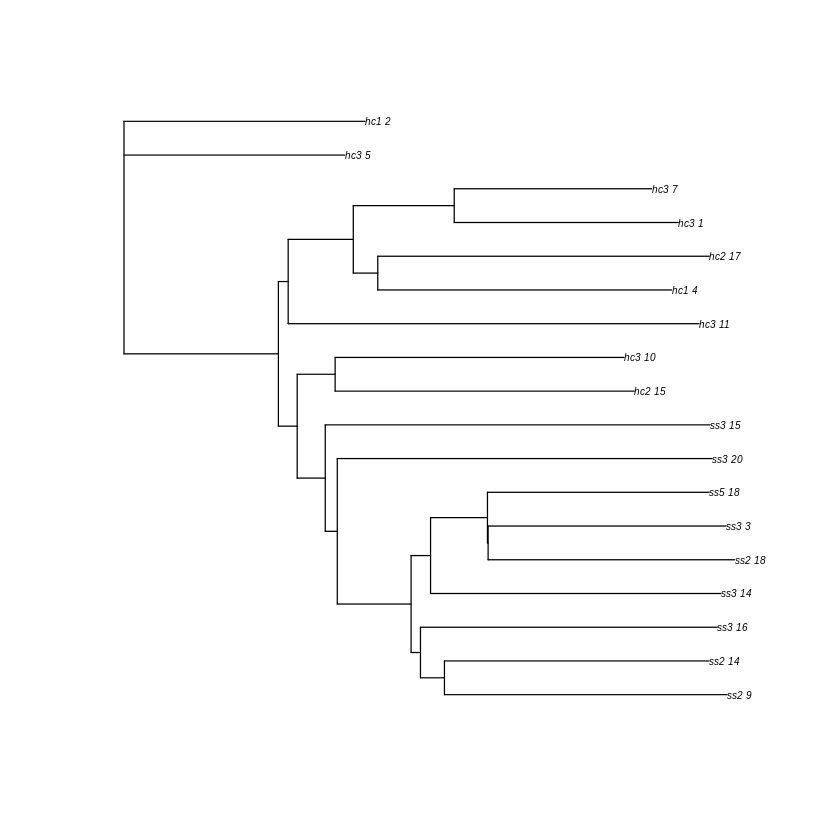

In [58]:
%expand 
library(ape)
library(phangorn)

#pdf(file=fout)

plot(read.tree("{POP}dist_mbd.tree"), cex=0.5)

## SFS for Fst

In [25]:
%expand
# extracting gene regions out of genome annotations file (gff3)
cat ../genome-features/Olurida_v081-20190709.gene.2kbslop.gff | cut -f 1,4,5,9 > {INPUT}gene_regions2kb.tab

In [26]:
%expand
head {INPUT}gene_regions2kb.tab

##gff-version 3
Contig1111	22968	28792	ID=OLUR_00006628;Name=OLUR_00006628;Alias=maker-Contig1111-snap-gene-0.1;Note=Similar to Spag6: Sperm-associated antigen 6 (Mus musculus OX%3D10090);Dbxref=Gene3D:G3DSA:1.25.10.10,InterPro:IPR000225,InterPro:IPR000357,InterPro:IPR011989,InterPro:IPR016024,Pfam:PF02985,SMART:SM00185,SUPERFAMILY:SSF48371;Ontology_term=GO:0005515;SPID=Q9JLI7;
Contig214118	1	1068	ID=OLUR_00032161;Name=OLUR_00032161;Alias=maker-Contig214118-snap-gene-0.0;Note=Protein of unknown function;Dbxref=Gene3D:G3DSA:3.10.450.10;
Contig58217	7736	11618	ID=OLUR_00019127;Name=OLUR_00019127;Alias=snap_masked-Contig58217-processed-gene-0.2;Note=Protein of unknown function;Dbxref=MobiDBLite:mobidb-lite;
Contig2046	295	19920	ID=OLUR_00011450;Name=OLUR_00011450;Alias=maker-Contig2046-snap-gene-0.5;Note=Protein of unknown function;
Contig9540	2303	12179	ID=OLUR_00018391;Name=OLUR_00018391;Alias=maker-Contig9540-snap-gene-0.1;Note=Protein of unknown function;Dbxref=Gene3D:G3DSA:2.170.300.

In [9]:
# reading gene regions
genes=read.table(paste0(INPUT,"gene_regions2kb.tab"),sep="\t")
names(genes)=c("contig","start","end","notes")

#### min 70% individuals

In [19]:
sfsSuf7 = "SFS/HCSS_sfsm70"

In [2]:
module load gcc/6.2.0
module load angsd/0.918

In [12]:
pwd

/scratch/t.cri.ksilliman/CommonG_cp2/2019_Mapping/ANGSD_run/HCSS


In [63]:
%expand [ ]

zcat [sfsSuf7].geno.gz | python ../../../2bRAD_denovo/HetMajorityProb.py | awk "\$6 < 0.75 {print \$1\"\\t\"\$2}" > [sfsSuf7]_aSites

In [64]:
%expand
angsd sites index {sfsSuf7}_aSites

	-> angsd version: 0.918 (htslib: 1.5) build(Aug  1 2017 16:32:01)
	-> Indexing SFS/HCSS_sfsm70_aSites and will add '0' to pos column
	-> Filterfile: SFS/HCSS_sfsm70_aSites supplied will generate binary representations... 
	-> Input file has 2 columns, chr pos
	-> Writing chr:'Contig0' 
	-> Writing chr:'Contig1' 
	-> Writing chr:'Contig2' 
	-> Writing chr:'Contig3' 
	-> Writing chr:'Contig4' 
	-> Writing chr:'Contig5' 
	-> Writing chr:'Contig6' 
	-> Writing chr:'Contig8' 
	-> Writing chr:'Contig9' 
	-> Writing chr:'Contig12' 
	-> Writing chr:'Contig13' 
	-> Writing chr:'Contig16' 
	-> Writing chr:'Contig17' 
	-> Writing chr:'Contig18' 
	-> Writing chr:'Contig21' 
	-> Writing chr:'Contig24' 
	-> Writing chr:'Contig25' 
	-> Writing chr:'Contig26' 
	-> Writing chr:'Contig28' 
	-> Writing chr:'Contig30' 
	-> Writing chr:'Contig32' 
	-> Writing chr:'Contig33' 
	-> Writing chr:'Contig35' 
	-> Writing chr:'Contig36' 
	-> Writing chr:'Contig38' 
	-> Writing chr:'Contig39' 
	-> Writing chr:'Con

In [65]:
%expand
# limit analysis to only retained chromosomes
cut -f1 {sfsSuf7}_aSites | sort | uniq > {sfsSuf7}_chrs.txt

In [66]:
%expand
# estimating site frequency likelihoods for each population, also saving allele frequencies (for genome scan) 
cd ../../mapped_over13/
export GENOME_REF=/scratch/t.cri.ksilliman/CommonG/2019_Mapping/Olurida_v081.fa
TODO="-doSaf 1 -doMajorMinor 1 -doMaf 1 -doPost 1 -anc $GENOME_REF -ref $GENOME_REF"
angsd -sites ../ANGSD_run/HCSS/{sfsSuf7}_aSites -rf ../ANGSD_run/HCSS/{sfsSuf7}_chrs.txt -b ../ANGSD_run/HCfiltnreps.bams -GL 1 -P 1 $TODO -out ../ANGSD_run/HCSS/{sfsSuf7}_popHC
angsd -sites ../ANGSD_run/HCSS/{sfsSuf7}_aSites -rf ../ANGSD_run/HCSS/{sfsSuf7}_chrs.txt -b ../ANGSD_run/SSfiltnreps.bams -GL 1 -P 1 $TODO -out ../ANGSD_run/HCSS/{sfsSuf7}_popSS


	-> angsd version: 0.918 (htslib: 1.5) build(Aug  1 2017 16:32:01)
	-> [prep_sites.cpp] Reading binary representation of '../ANGSD_run/HCSS/SFS/HCSS_sfsm70_aSites'
	-> [prep_sites.cpp] nChr: 8960 loaded from binary filter file
	-> [abcFilter.cpp] -sites is still beta, use at own risk...
	-> Reading fasta: /scratch/t.cri.ksilliman/CommonG/2019_Mapping/Olurida_v081.fa
	-> Reading fasta: /scratch/t.cri.ksilliman/CommonG/2019_Mapping/Olurida_v081.fa
	-> !! You are doing -dosaf incombination with -rf, please make sure that your -rf file is sorted !!
	-> Parsing 57 number of samples 
	-> Region lookup 1/8960
	-> Region lookup 2/8960
	-> Region lookup 3/8960
	-> Region lookup 4/8960
	-> Region lookup 5/8960
	-> Region lookup 6/8960
	-> Region lookup 7/8960
	-> Region lookup 8/8960
	-> Region lookup 9/8960
	-> Region lookup 10/8960
	-> Region lookup 11/8960
	-> Region lookup 12/8960
	-> Region lookup 13/8960
	-> Region lookup 14/8960
	-> Region lookup 15/8960
	-> Region lookup 16/8960
	-> Regi

In [67]:
cd ../ANGSD_run/HCSS

In [68]:
%expand
# generating per-population SFS
realSFS {sfsSuf7}_popHC.saf.idx > {sfsSuf7}_popHC.sfs
realSFS {sfsSuf7}_popSS.saf.idx > {sfsSuf7}_popSS.sfs

	-> Version of fname:SFS/HCSS_sfsm70_popHC.saf.idx is:2
	-> Assuming .saf.gz file: SFS/HCSS_sfsm70_popHC.saf.gz
	-> Assuming .saf.pos.gz: SFS/HCSS_sfsm70_popHC.saf.pos.gz
	-> args: tole:0.000001 nthreads:4 maxiter:100 nsites:0 start:(null) chr:(null) start:-1 stop:-1 fname:SFS/HCSS_sfsm70_popHC.saf.idx fstout:(null) oldout:0 seed:1568743226 bootstrap:0 whichFst:0
	-> nSites: 369293
	-> The choice of -nSites will require atleast: 164.822693 megabyte memory, that is at least: 0.13% of total memory
	-> dim(SFS/HCSS_sfsm70_popHC.saf.idx):115
	-> Dimension of parameter space: 115
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig0
	-> hello Im the master merge part of realSFS. and I'll now do a tripple bypass to find intersect 
	-> 1) Will set iter according to chooseChr and start and stop, and possibly using -sites
	-> Only read nSites: 102 will therefore prepare next chromosome (or exit)
	-> Done reading data from chr

In [69]:
%expand
# writing down 2d-SFS priors
realSFS {sfsSuf7}_popHC.saf.idx {sfsSuf7}_popSS.saf.idx -P 8 > {sfsSuf7}_2pop.sfs ; \
realSFS fst index {sfsSuf7}_popHC.saf.idx {sfsSuf7}_popSS.saf.idx -sfs {sfsSuf7}_2pop.sfs -fstout {sfsSuf7}_fst2pop 

	-> Version of fname:SFS/HCSS_sfsm70_popHC.saf.idx is:2
	-> Assuming .saf.gz file: SFS/HCSS_sfsm70_popHC.saf.gz
	-> Assuming .saf.pos.gz: SFS/HCSS_sfsm70_popHC.saf.pos.gz
	-> Version of fname:SFS/HCSS_sfsm70_popSS.saf.idx is:2
	-> Assuming .saf.gz file: SFS/HCSS_sfsm70_popSS.saf.gz
	-> Assuming .saf.pos.gz: SFS/HCSS_sfsm70_popSS.saf.pos.gz
	-> args: tole:0.000001 nthreads:8 maxiter:100 nsites:0 start:(null) chr:(null) start:-1 stop:-1 fname:SFS/HCSS_sfsm70_popSS.saf.idx fstout:(null) oldout:0 seed:1568743269 bootstrap:0 whichFst:0
	-> Multi SFS is 'still' under development. Please report strange behaviour
	-> nSites: 369295
	-> The choice of -nSites will require atleast: 329.647186 megabyte memory, that is at least: 0.26% of total memory
	-> dim(SFS/HCSS_sfsm70_popHC.saf.idx):115
	-> dim(SFS/HCSS_sfsm70_popSS.saf.idx):115
	-> Dimension of parameter space: 13225
	-> Done reading data from chromosome will prepare next chromosome
	-> Is in multi sfs, will now read data from chr:Contig0
	-

In [70]:
%expand
# global Fst between pops
realSFS fst stats {sfsSuf7}_fst2pop.fst.idx

	-> Assuming idxname:SFS/HCSS_sfsm70_fst2pop.fst.idx
	-> Assuming .fst.gz file: SFS/HCSS_sfsm70_fst2pop.fst.gz
	-> FST.Unweight[nObs:367299]:0.005905 Fst.Weight:0.097039
0.005905 0.097039


In [71]:
%expand
# per-site Fst
realSFS fst print {sfsSuf7}_fst2pop.fst.idx > {sfsSuf7}_fst2pop.fst

	-> Assuming idxname:SFS/HCSS_sfsm70_fst2pop.fst.idx
	-> Assuming .fst.gz file: SFS/HCSS_sfsm70_fst2pop.fst.gz
	-> Information from index file: nSites:369287 nChrs:8960
	-> Population[0]: SFS/HCSS_sfsm70_popHC.saf.idx
	-> Population[1]: SFS/HCSS_sfsm70_popSS.saf.idx
		0	Contig0	102	8
		1	Contig1	72	2048
		2	Contig100010	36	3488
		3	Contig100040	36	4208
		4	Contig100198	36	4928
		5	Contig100242	33	5648
		6	Contig100254	36	6308
		7	Contig100275	36	7028
		8	Contig100339	36	7748
		9	Contig100351	36	8468
		10	Contig100379	36	9188
		11	Contig100396	36	9908
		12	Contig100415	33	10628
		13	Contig100430	36	11288
		14	Contig100439	36	12008
		15	Contig100451	35	12728
		16	Contig100484	36	13428
		17	Contig1005	36	14148
		18	Contig10050	36	14868
		19	Contig100504	36	15588
		20	Contig100506	36	16308
		21	Contig100572	36	17028
		22	Contig100585	29	17748
		23	Contig100634	36	18328
		24	Contig100640	36	19048
		25	Contig100644	36	19768
		26	Contig100664	28	20488
		27	Contig100676	36	21048
		28	Contig100

Keyboard Interrupt


In [11]:
list.of.packages <- c("reshape2","dplyr", "tidyr", "readr", "stringr", "plotly","tidyverse") #add new libraries here 
new.packages <- list.of.packages[!(list.of.packages %in% installed.packages()[,"Package"])]
if(length(new.packages)) install.packages(new.packages)

# Load all libraries 
lapply(list.of.packages, FUN = function(X) {
  do.call("require", list(X)) 
})

also installing the dependencies ‘sys’, ‘askpass’, ‘rematch’, ‘processx’, ‘curl’, ‘openssl’, ‘later’, ‘dplyr’, ‘lifecycle’, ‘cellranger’, ‘progress’, ‘callr’, ‘cli’, ‘fs’, ‘selectr’, ‘iterators’, ‘tinytex’, ‘httr’, ‘lazyeval’, ‘crosstalk’, ‘promises’, ‘dbplyr’, ‘forcats’, ‘haven’, ‘lubridate’, ‘modelr’, ‘readxl’, ‘reprex’, ‘rvest’, ‘xml2’, ‘foreach’, ‘rmarkdown’, ‘RSpectra’, ‘RcppEigen’


Loading required package: reshape2

Loading required package: dplyr

Error: package or namespace load failed for ‘dplyr’ in loadNamespace(j <- i[[1L]], c(lib.loc, .libPaths()), versionCheck = vI[[j]]):
 namespace ‘lifecycle’ 0.2.0 is already loaded, but >= 1.0.0 is required

Loading required package: tidyr

Error: package or namespace load failed for ‘tidyr’ in loadNamespace(j <- i[[1L]], c(lib.loc, .libPaths()), versionCheck = vI[[j]]):
 namespace ‘lifecycle’ 0.2.0 is already loaded, but >= 1.0.0 is required

Loading required package: readr

Loading required package: stringr

Loading required package

[[1]]
[1] TRUE

[[2]]
[1] FALSE

[[3]]
[1] FALSE

[[4]]
[1] TRUE

[[5]]
[1] TRUE

[[6]]
[1] FALSE

[[7]]
[1] FALSE

[[8]]
[1] TRUE

In [13]:
# reading gene regions
#genes=read.table("gene_regions2kb.tab")
#names(genes)=c("contig","start","end","notes")
genes <- 
  read_delim(file = "../analyses/2bRAD/Inputs/gene_regions2kb.tab", delim = "\t", col_names = c("contig","start","end","notes_gene"),skip = 1) 


── Column specification ────────────────────────────────────────────────────────
cols(
  contig = col_character(),
  start = col_double(),
  end = col_double(),
  notes_gene = col_character()
)




In [31]:
%expand
fst01=read.table("{sfsSuf7}_fst2pop.fst")
names(fst01)=c("contig","pos","a","b")

fst01$contig=as.character(fst01$contig)

In [32]:
# removing zero-only (invariant) bases
fst01[,3:4]=round(fst01[,3:4],3)
ch01=apply(fst01[,3:4],1,sum)
chh=(ch01>0)
table(chh)

fst01=fst01[chh,]
head(fst01)

chh
 FALSE   TRUE 
363405   5882 

,contig,pos,a,b
64,Contig0,74432,0.000,0.009
82,Contig0,109103,0.034,0.457
98,Contig0,109119,0.003,0.052
102,Contig0,109123,0.002,0.067
114,Contig1,40362,0.000,0.009
169,Contig1,42880,0.003,0.078


In [33]:
%expand
fst01$fst=fst01$a/(fst01$b+1e-3)
head(fst01)
write.csv(fst01,file="{sfsSuf7}_PerSiteFst.csv",quote=F,row.names=F)

,contig,pos,a,b,fst
64,Contig0,74432,0.000,0.009,0.00000000
82,Contig0,109103,0.034,0.457,0.07423581
98,Contig0,109119,0.003,0.052,0.05660377
102,Contig0,109123,0.002,0.067,0.02941176
114,Contig1,40362,0.000,0.009,0.00000000
169,Contig1,42880,0.003,0.078,0.03797468


In [1]:
fst01 <- read.csv("../analyses/2bRAD/HCSS_sfsm70_PerSiteFst.csv")

In [5]:
head(fst01)

,contig,pos,a,b,fst
,<fct>,<int>,<dbl>,<dbl>,<dbl>
1,Contig0,74432,0.000,0.009,0.00000000
2,Contig0,109103,0.034,0.457,0.07423581
3,Contig0,109119,0.003,0.052,0.05660377
4,Contig0,109123,0.002,0.067,0.02941176
5,Contig1,40362,0.000,0.009,0.00000000
6,Contig1,42880,0.003,0.078,0.03797468


In [9]:
#weighted Fst
sum(fst01$a)/sum(fst01$b)

[1] 0.09706945

In [4]:
#unweighted Fst
rat <- fst01$a/fst01$b
mean(rat, na.rm=T)
sd(rat, na.rm=T)

[1] 0.05959145

[1] 0.08741689

In [6]:
mean(fst01$fst)

[1] 0.05923846

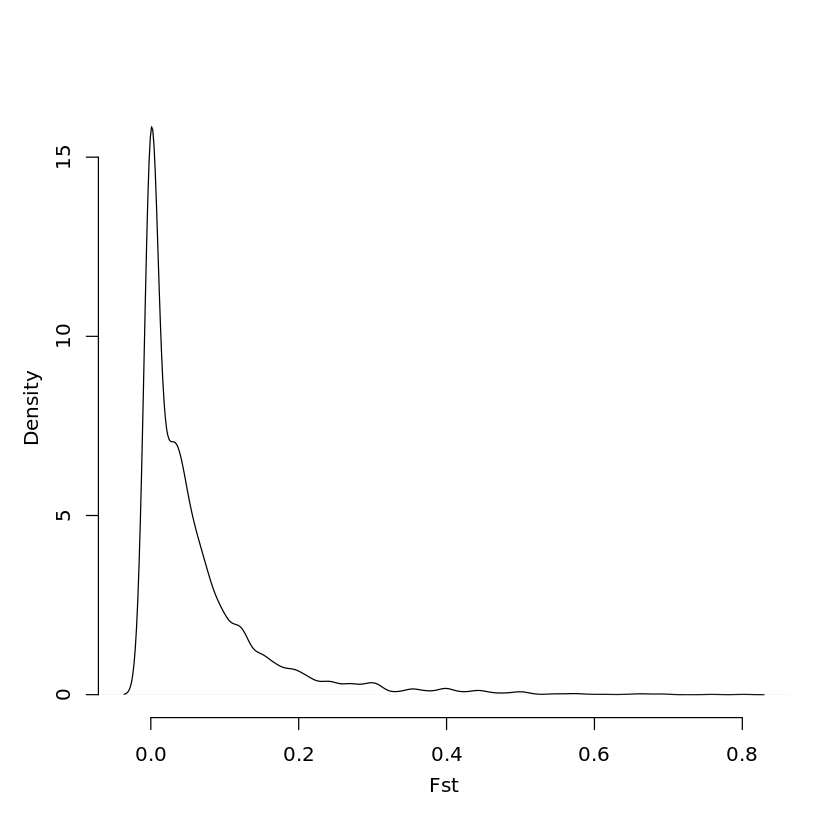

In [12]:
# Fst density
jitter=0
#jitter=rnorm(nrow(fst01),0,0.0)
f1=fst01$a/(fst01$b+1e-3)+jitter
plot(density(f1),ylim=c(0,16),xlab="Fst",main="",mgp=c(2.3,1,0),bty="n")

In [14]:
# computing weighted Fst per gene
i=1;gfst01=c();ns01=0;snp=c();a=c();b=c()

pb=txtProgressBar(0,nrow(genes))
for (i in 1:nrow(genes)) {
	setTxtProgressBar(pb,i)
	sub=subset(fst01,contig==genes$contig[i] & pos>=genes$start[i] & pos<=genes$end[i])
	if (is.null(sub[1,1]) | sum(sub$b)==0) { 
		gfst01=append(gfst01,NA)
	} else {
		gfst01=append(gfst01,sum(sub$a)/sum(sub$b))
		ns01=ns01+nrow(sub)
        snp=append(snp,paste(sub$contig,sub$pos,sep="_"))
        a=append(a,sub$a)
        b=append(b,sub$b)
	}
}

#### Number of SNPs found in genes   

In [15]:
length(unique(snp))

[1] 1909

In [17]:
geneSites <- cbind(as.data.frame(snp,stringsAsFactors = F),a,b,stringsAsFactors = F)
geneSites <- unique(geneSites)
dim(geneSites)

[1] 1909    3

In [18]:
head(geneSites)

,snp,a,b
,<chr>,<dbl>,<dbl>
1,Contig103346_12046,0.007,0.344
2,Contig103346_16201,0.043,0.374
3,Contig60108_2787,0.015,0.123
4,Contig27784_1887,0.012,0.283
5,Contig27784_1888,0.000,0.009
6,Contig38648_13412,0.019,0.397


In [19]:
#weighted Fst for SNPs in genes
sum(geneSites$a)/sum(geneSites$b)

[1] 0.09324184

In [20]:
#unweighted Fst for SNPs in genes
rat <- geneSites$a/geneSites$b
mean(rat,na.rm=T)
sd(rat,na.rm=T)

[1] 0.05865817

[1] 0.08410826

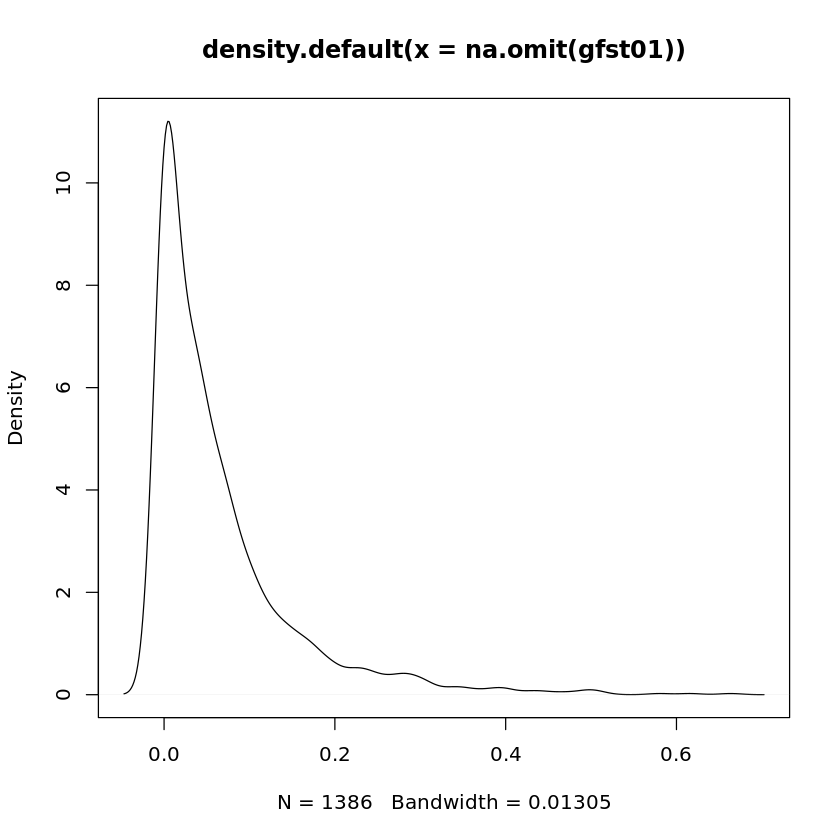

In [21]:
# density plots of per-gene Fst
plot(density(na.omit(gfst01)))

In [22]:
head(genes)

contig,start,end,notes_gene
<chr>,<dbl>,<dbl>,<chr>
Contig1111,22968,28792,"ID=OLUR_00006628;Name=OLUR_00006628;Alias=maker-Contig1111-snap-gene-0.1;Note=Similar to Spag6: Sperm-associated antigen 6 (Mus musculus OX%3D10090);Dbxref=Gene3D:G3DSA:1.25.10.10,InterPro:IPR000225,InterPro:IPR000357,InterPro:IPR011989,InterPro:IPR016024,Pfam:PF02985,SMART:SM00185,SUPERFAMILY:SSF48371;Ontology_term=GO:0005515;SPID=Q9JLI7;"
Contig214118,1,1068,ID=OLUR_00032161;Name=OLUR_00032161;Alias=maker-Contig214118-snap-gene-0.0;Note=Protein of unknown function;Dbxref=Gene3D:G3DSA:3.10.450.10;
Contig58217,7736,11618,ID=OLUR_00019127;Name=OLUR_00019127;Alias=snap_masked-Contig58217-processed-gene-0.2;Note=Protein of unknown function;Dbxref=MobiDBLite:mobidb-lite;
Contig2046,295,19920,ID=OLUR_00011450;Name=OLUR_00011450;Alias=maker-Contig2046-snap-gene-0.5;Note=Protein of unknown function;
Contig9540,2303,12179,ID=OLUR_00018391;Name=OLUR_00018391;Alias=maker-Contig9540-snap-gene-0.1;Note=Protein of unknown function;Dbxref=Gene3D:G3DSA:2.170.300.10;
Contig52254,6908,13733,"ID=OLUR_00011614;Name=OLUR_00011614;Alias=maker-Contig52254-snap-gene-0.1;Note=Similar to MM_0045: Putative ankyrin repeat protein MM_0045 (Methanosarcina mazei (strain ATCC BAA-159 / DSM 3647 / Goe1 / Go1 / JCM 11833 / OCM 88) OX%3D192952);Dbxref=CDD:cd00204,Gene3D:G3DSA:1.25.40.20,InterPro:IPR002110,InterPro:IPR020683,InterPro:IPR036770,PRINTS:PR01415,Pfam:PF12796,Pfam:PF13606,Pfam:PF13857,ProSiteProfiles:PS50088,ProSiteProfiles:PS50297,SMART:SM00248,SUPERFAMILY:SSF48403;Ontology_term=GO:0005515;SPID=Q8Q0U0;"


In [39]:
# adding results to genes table, saving
genes$fst01=gfst01
id <- paste(genes$contig,genes$start,genes$end,sep="_")
genes <- cbind(id,genes)
head(genes[!is.na(genes$fst01),])
save(genes,file="_PerGeneFst.RData")

,id,contig,start,end,notes_gene,fst01
11,Contig103346_4131_18776,Contig103346,4131,18776,"ID=OLUR_00011851;Name=OLUR_00011851;Alias=maker-Contig103346-snap-gene-0.4;Note=Similar to HSPA12B: Heat shock 70 kDa protein 12B (Homo sapiens OX%3D9606);Dbxref=CDD:cd10229,Gene3D:G3DSA:3.30.420.40,Gene3D:G3DSA:3.90.640.10,InterPro:IPR013126,PRINTS:PR00301,Pfam:PF00012,SUPERFAMILY:SSF53067;SPID=Q96MM6;",0.069637883
24,Contig60108_1_13731,Contig60108,1,13731,"ID=OLUR_00014779;Name=OLUR_00014779;Alias=maker-Contig60108-snap-gene-0.2;Note=Similar to MLH3: DNA mismatch repair protein Mlh3 (Homo sapiens OX%3D9606);Dbxref=Gene3D:G3DSA:3.30.230.10,Gene3D:G3DSA:3.30.565.10,InterPro:IPR013507,InterPro:IPR014721,InterPro:IPR020568,InterPro:IPR036890,MobiDBLite:mobidb-lite,Pfam:PF01119,SMART:SM01340,SUPERFAMILY:SSF54211,SUPERFAMILY:SSF55874;Ontology_term=GO:0005524,GO:0006298,GO:0030983;SPID=Q9UHC1;",0.121951220
34,Contig27784_1_12761,Contig27784,1,12761,"ID=OLUR_00013246;Name=OLUR_00013246;Alias=maker-Contig27784-snap-gene-0.2;Note=Similar to Fbxl6: F-box/LRR-repeat protein 6 (Mus musculus OX%3D10090);Dbxref=Gene3D:G3DSA:3.80.10.10,InterPro:IPR032675,SUPERFAMILY:SSF52047;SPID=Q9QXW0;",0.041095890
41,Contig38648_3515_20578,Contig38648,3515,20578,"ID=OLUR_00010999;Name=OLUR_00010999;Alias=maker-Contig38648-snap-gene-0.2;Note=Similar to Rnf8: E3 ubiquitin-protein ligase RNF8 (Mus musculus OX%3D10090);Dbxref=CDD:cd16535,Coils:Coil,Gene3D:G3DSA:3.30.40.10,InterPro:IPR001841,InterPro:IPR013083,InterPro:IPR017907,MobiDBLite:mobidb-lite,Pfam:PF13923,ProSitePatterns:PS00518,ProSiteProfiles:PS50089,SMART:SM00184,SUPERFAMILY:SSF57850;SPID=Q8VC56;",0.047858942
119,Contig282_38634_44741,Contig282,38634,44741,"ID=OLUR_00002451;Name=OLUR_00002451;Alias=snap_masked-Contig282-processed-gene-0.4;Note=Similar to Cry2: Cryptochrome-2 (Rattus norvegicus OX%3D10116);Dbxref=Gene3D:G3DSA:3.40.50.620,InterPro:IPR006050,InterPro:IPR014729,InterPro:IPR036155,Pfam:PF00875,ProSiteProfiles:PS51645,SUPERFAMILY:SSF52425;SPID=Q923I8;",0.001798561
120,Contig282_26273_42182,Contig282,26273,42182,"ID=OLUR_00002450;Name=OLUR_00002450;Alias=maker-Contig282-snap-gene-0.10;Note=Similar to API5: Apoptosis inhibitor 5 (Pongo abelii OX%3D9601);Dbxref=Coils:Coil,InterPro:IPR008383,InterPro:IPR016024,MobiDBLite:mobidb-lite,Pfam:PF05918,SUPERFAMILY:SSF48371;SPID=Q5R644;",0.001644737


In [48]:
%expand
# saving table of per-gene Fst for GO_MWU analysis
f01=genes[!is.na(genes$fst01),]
nrow(f01)
write.table(f01,file="{sfsSuf7}_PerGeneFst.tab",quote=F,row.names=F,sep="\t")

[1] 1386

In [41]:
head(f01)

,id,contig,start,end,notes_gene,fst01
11,Contig103346_4131_18776,Contig103346,4131,18776,"ID=OLUR_00011851;Name=OLUR_00011851;Alias=maker-Contig103346-snap-gene-0.4;Note=Similar to HSPA12B: Heat shock 70 kDa protein 12B (Homo sapiens OX%3D9606);Dbxref=CDD:cd10229,Gene3D:G3DSA:3.30.420.40,Gene3D:G3DSA:3.90.640.10,InterPro:IPR013126,PRINTS:PR00301,Pfam:PF00012,SUPERFAMILY:SSF53067;SPID=Q96MM6;",0.069637883
24,Contig60108_1_13731,Contig60108,1,13731,"ID=OLUR_00014779;Name=OLUR_00014779;Alias=maker-Contig60108-snap-gene-0.2;Note=Similar to MLH3: DNA mismatch repair protein Mlh3 (Homo sapiens OX%3D9606);Dbxref=Gene3D:G3DSA:3.30.230.10,Gene3D:G3DSA:3.30.565.10,InterPro:IPR013507,InterPro:IPR014721,InterPro:IPR020568,InterPro:IPR036890,MobiDBLite:mobidb-lite,Pfam:PF01119,SMART:SM01340,SUPERFAMILY:SSF54211,SUPERFAMILY:SSF55874;Ontology_term=GO:0005524,GO:0006298,GO:0030983;SPID=Q9UHC1;",0.121951220
34,Contig27784_1_12761,Contig27784,1,12761,"ID=OLUR_00013246;Name=OLUR_00013246;Alias=maker-Contig27784-snap-gene-0.2;Note=Similar to Fbxl6: F-box/LRR-repeat protein 6 (Mus musculus OX%3D10090);Dbxref=Gene3D:G3DSA:3.80.10.10,InterPro:IPR032675,SUPERFAMILY:SSF52047;SPID=Q9QXW0;",0.041095890
41,Contig38648_3515_20578,Contig38648,3515,20578,"ID=OLUR_00010999;Name=OLUR_00010999;Alias=maker-Contig38648-snap-gene-0.2;Note=Similar to Rnf8: E3 ubiquitin-protein ligase RNF8 (Mus musculus OX%3D10090);Dbxref=CDD:cd16535,Coils:Coil,Gene3D:G3DSA:3.30.40.10,InterPro:IPR001841,InterPro:IPR013083,InterPro:IPR017907,MobiDBLite:mobidb-lite,Pfam:PF13923,ProSitePatterns:PS00518,ProSiteProfiles:PS50089,SMART:SM00184,SUPERFAMILY:SSF57850;SPID=Q8VC56;",0.047858942
119,Contig282_38634_44741,Contig282,38634,44741,"ID=OLUR_00002451;Name=OLUR_00002451;Alias=snap_masked-Contig282-processed-gene-0.4;Note=Similar to Cry2: Cryptochrome-2 (Rattus norvegicus OX%3D10116);Dbxref=Gene3D:G3DSA:3.40.50.620,InterPro:IPR006050,InterPro:IPR014729,InterPro:IPR036155,Pfam:PF00875,ProSiteProfiles:PS51645,SUPERFAMILY:SSF52425;SPID=Q923I8;",0.001798561
120,Contig282_26273_42182,Contig282,26273,42182,"ID=OLUR_00002450;Name=OLUR_00002450;Alias=maker-Contig282-snap-gene-0.10;Note=Similar to API5: Apoptosis inhibitor 5 (Pongo abelii OX%3D9601);Dbxref=Coils:Coil,InterPro:IPR008383,InterPro:IPR016024,MobiDBLite:mobidb-lite,Pfam:PF05918,SUPERFAMILY:SSF48371;SPID=Q5R644;",0.001644737


In [42]:
mean(f01$fst01)

[1] 0.0645743

#### GO enrichment of genes with fst > 0.3.

In [23]:
f01 <- read.csv("../analyses/2bRAD/HCSS_sfsm70_PerGeneFst.csv")
head(f01)

,id,contig,start,end,fst01
,<fct>,<fct>,<int>,<int>,<dbl>
1,Contig103346_4131_18776,Contig103346,4131,18776,0.069637883
2,Contig60108_1_13731,Contig60108,1,13731,0.121951220
3,Contig27784_1_12761,Contig27784,1,12761,0.041095890
4,Contig38648_3515_22246,Contig38648,3515,22246,0.047858942
5,Contig282_38634_45331,Contig282,38634,45331,0.001798561
6,Contig282_26273_42182,Contig282,26273,42182,0.001644737


In [26]:
g03 <- f01[which(f01[,5]>=0.3),]
dim(g03)

[1] 38  5

In [27]:
write.table(g03,"../analyses/2bRAD/PopGen/fst2kb_g03.tab",row.names = F, col.names = T,quote = F, sep = "\t")

In [28]:
nrow(g03)

[1] 38

In [29]:
head(g03)

,id,contig,start,end,fst01
,<fct>,<fct>,<int>,<int>,<dbl>
17,Contig29033_11407_32648,Contig29033,11407,32648,0.4417040
48,Contig77382_1559_12918,Contig77382,1559,12918,0.6633523
110,Contig34298_13092_53017,Contig34298,13092,53017,0.3714286
157,Contig1300_24883_44806,Contig1300,24883,44806,0.3311037
159,Contig70496_1_7124,Contig70496,1,7124,0.6157895
164,Contig37670_5585_15651,Contig37670,5585,15651,0.3006897


In [31]:
# fst background uniprot
cis_back <- read_delim("../analyses/2bRAD/HCSS_sfsm70_PerGeneFst.tab", delim = '\t', col_names = T) %>% as_tibble()
cis_back <- cis_back %>%
    mutate(ID=str_extract(notes_gene, "ID=(.*?);"),
       Parent=str_extract(notes_gene, "Parent=(.*?);"),
       Name=str_extract(notes_gene, "Name=(.*?);"),
       Alias=str_extract(notes_gene, "Alias=(.*?);"),
       AED=str_extract(notes_gene, "AED=(.*?);"),
       eAED=str_extract(notes_gene, "eAED=(.*?);"),
       Note=str_extract(notes_gene, "Note=(.*?);"),
       Ontology_term=str_extract(notes_gene, "Ontology_term=(.*?);"),
       Dbxref=str_extract(notes_gene, "Dbxref=(.*?);"),
       uniprotID=str_extract(notes_gene, "SPID=(.*?);")
       ) 
cis_back %>%
   mutate(uniprotID=str_remove(uniprotID, "SPID=")) %>% mutate(uniprotID=str_remove(uniprotID, ";")) %>%
  select(uniprotID) %>% na.omit() %>% as.vector() %>% unique() %>% write.table(file="../analyses/2bRAD/PopGen/background_fst_genes2kb_uniprot.txt",quote = F,row.names = F,col.names = F)

ERROR: Error in as_tibble(.): could not find function "as_tibble"


In [56]:
%expand
# fst background uniprot
cis_back <- read_delim("../analyses/2bRAD/PopGen/fst2kb_g03.tab", delim = '\t', col_names = T) %>% as_tibble()
cis_back <- cis_back %>%
    mutate(ID=str_extract(notes_gene, "ID=(.*?);"),
       Parent=str_extract(notes_gene, "Parent=(.*?);"),
       Name=str_extract(notes_gene, "Name=(.*?);"),
       Alias=str_extract(notes_gene, "Alias=(.*?);"),
       AED=str_extract(notes_gene, "AED=(.*?);"),
       eAED=str_extract(notes_gene, "eAED=(.*?);"),
       Note=str_extract(notes_gene, "Note=(.*?);"),
       Ontology_term=str_extract(notes_gene, "Ontology_term=(.*?);"),
       Dbxref=str_extract(notes_gene, "Dbxref=(.*?);"),
       uniprotID=str_extract(notes_gene, "SPID=(.*?);")
       ) 
cis_back %>%
   mutate(uniprotID=str_remove(uniprotID, "SPID=")) %>% mutate(uniprotID=str_remove(uniprotID, ";")) %>%
  select(uniprotID) %>% na.omit() %>% as.vector() %>% unique() %>% write.table(file="Results/fstg03_genes2kb_uniprot.txt",quote = F,row.names = F,col.names = F)

Parsed with column specification:
cols(
  id = col_character(),
  contig = col_character(),
  start = col_double(),
  end = col_double(),
  notes_gene = col_character(),
  fst01 = col_double()
)



In [57]:
wc -l Results/background_fst_genes2kb_uniprot.txt

796 Results/background_fst_genes2kb_uniprot.txt


26 david ids, 796 in background.  
Enriched for: BP: endocytosis, BP: apoptotic process, BP: steroid hormone mediated signaling pathway, regulation of autophagy; Up: Zinc-finger

In [ ]:
# original fstPerGene.R script, here for reference
# reading gene regions
genes=read.table("genes.txt")
names(genes)=c("contig","start","end","gene")

# adding gene annotations, in the same order as genes.txt (skip if you don't have such file):
gnames=read.table("gnames.txt",sep="\t")
names(gnames)=c("gene","protein")
genes=merge(genes,gnames,by="gene",all.x=T)
genes$protein=as.character(genes$protein)
genes$protein[is.na(genes$protein)]="unknown"
nrow(genes[genes$protein!="unknown",])

fst01=read.table("p01.fst")
names(fst01)=c("contig","pos","a","b")

fst01$contig=as.character(fst01$contig)
fst34$contig=as.character(fst34$contig)

# removing zero-only (invariant) bases
fst01[,3:4]=round(fst01[,3:4],3)
ch01=apply(fst01[,3:4],1,sum)
chh=(ch01>0)
table(chh)
 # FALSE   TRUE 
# 932541  41886 

fst01=fst01[chh,]
head(fst01)

# Fst density
jitter=0
#jitter=rnorm(nrow(fst01),0,0.0)
f1=fst01$a/(fst01$b+1e-3)+jitter
plot(density(f1),ylim=c(0,7),xlab="Fst",main="",mgp=c(2.3,1,0),bty="n")

# computing weighted Fst per gene
i=1;gfst01=c();ns01=0
pb=txtProgressBar(0,nrow(genes))
for (i in 1:nrow(genes)) {
	setTxtProgressBar(pb,i)
	sub=subset(fst01,contig==genes$contig[i] & pos>=genes$start[i] & pos<=genes$end[i])
	if (is.null(sub[1,1]) | sum(sub$b)==0) { 
		gfst01=append(gfst01,NA)
	} else {
		gfst01=append(gfst01,sum(sub$a)/sum(sub$b))
		ns01=ns01+nrow(sub)
	}
}

# density plots of per-gene Fst
plot(density(na.omit(gfst01)))

# adding results to genes table, saving
genes$fst01=gfst01
head(genes[genes$protein!="unknown",])
save(genes,file="PerGeneFst.RData")

# saving table of per-gene Fst for GO_MWU analysis
f01=genes[,c("gene","fst01")]
f01=na.omit(f01)
nrow(f01)
write.csv(f01,file="f01.csv",quote=F,row.names=F)

